<a href="https://colab.research.google.com/github/lorehaze/Face_Detection_In_Dark_Conditions/blob/main/FacialDetection_High_Dark.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [108]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import skimage.io
import io
#from scipy.misc import imsave
from keras.preprocessing.image import save_img
from skimage import data, img_as_float
from skimage import exposure
import imread
import cv2
from skimage import io
from google.colab.patches import cv2_imshow

In [93]:
matplotlib.rcParams['font.size'] = 8

In [104]:
def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()
    ax_img.set_adjustable('box')

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

In [96]:
# Load an example image
#img = data.imread('/home/fakrul/Downloads/kkkk.jpg')/home/fakrul/Documents/thesis /images

img = io.imread('/content/images/image 1.jpg')
img_o = io.imread('/content/images/image 1.jpg')
img_p = io.imread('/content/images/image 1.jpg')
img_q = io.imread('/content/images/image 1.jpg')

io.imsave('/content/face/img.jpg',img,check_contrast=False) #check_contrast=False disables warning

In [97]:
# Contrast stretching
p2, p98 = np.percentile(img, (2, 98))
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))
io.imsave('/content/face/contrast_stretching/contrast_stretched.jpg',img_rescale)

In [101]:
# Equalization
img_eq = exposure.equalize_hist(img)
io.imsave('/content/face/histogram_equalization/histogram_equalized.jpg',img_eq)

/usr/local/lib/python3.7/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


In [102]:
# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
io.imsave('/content/face/adaptive_equalization/adaptive_equalized.jpg',img_adapteq)

/usr/local/lib/python3.7/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)
/usr/local/lib/python3.7/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)
/usr/local/lib/python3.7/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)
/usr/local/lib/python3.7/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You c

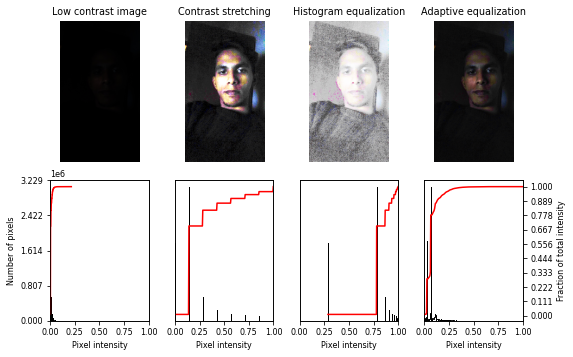

(0, 55)

In [106]:
# Display results
fig = plt.figure(figsize=(8,5))
axes = np.zeros((2, 4), dtype=object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale, axes[:, 1])
ax_img.set_title('Contrast stretching')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq, axes[:, 2])
ax_img.set_title('Histogram equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 3])
ax_img.set_title('Adaptive equalization')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 10))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()
#img.dtype
#img.min(),img.max()

In [113]:
#loading face and eye cascades - 
face_cascade = cv2.CascadeClassifier('/content/cascades/haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('/content/cascades/haarcascade_eye.xml')

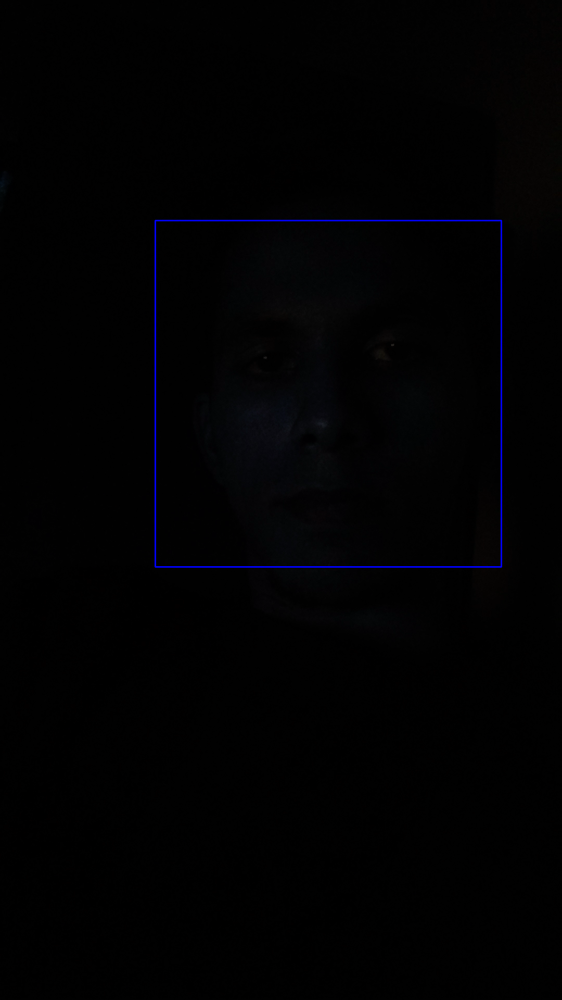

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: /content/face/contrast_stretching/detect.jpg is a low contrast image


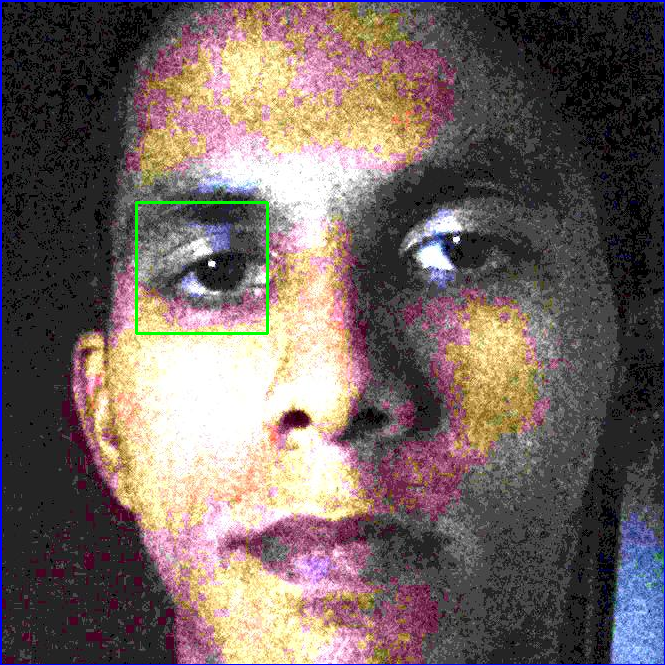

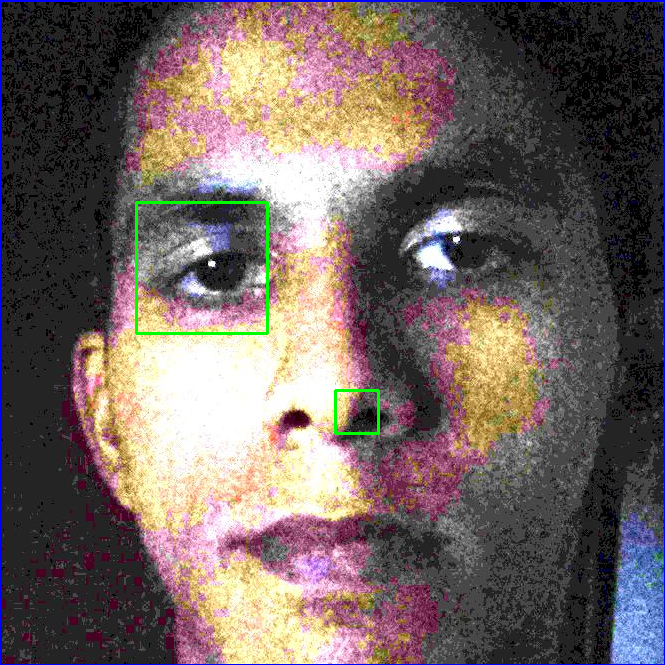

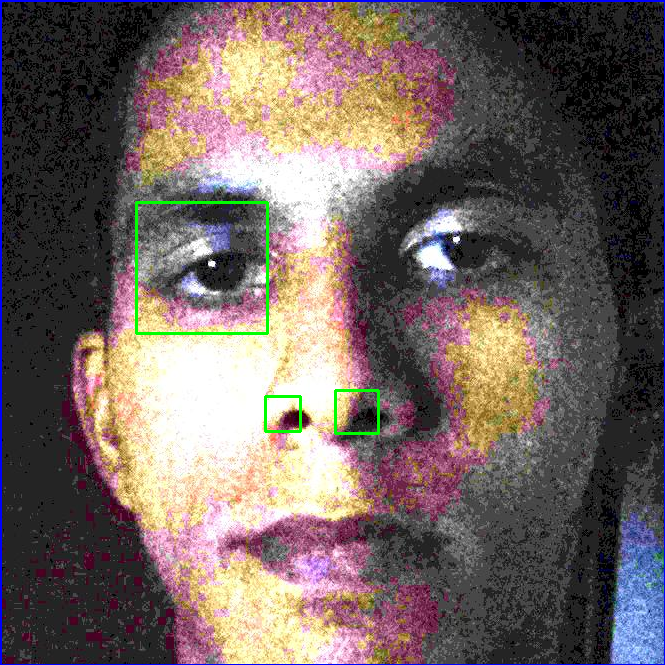

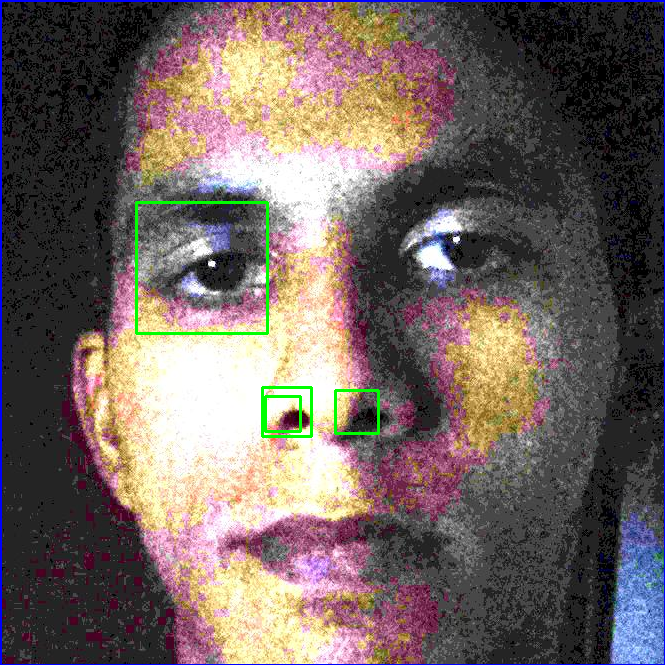

In [124]:
#Try to detect contrast stretched
img = cv2.imread('/content/face/contrast_stretching/contrast_stretched.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray,1.1, 5)
for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    cv2.rectangle(img_o,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]

    cv2.imwrite('/content/face/contrast_stretching/cropped.jpg', roi_color)
    
    #cv2.imwrite('gyt.jpg',roi_color)
    #eyes = eye_cascade.detectMultiScale(roi_gray)
    cv2_imshow(img_o)
    io.imsave('/content/face/contrast_stretching/detect.jpg',img_o)
    #for (ex,ey,ew,eh) in eyes:
    #   cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
    #    cv2_imshow(roi_color)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

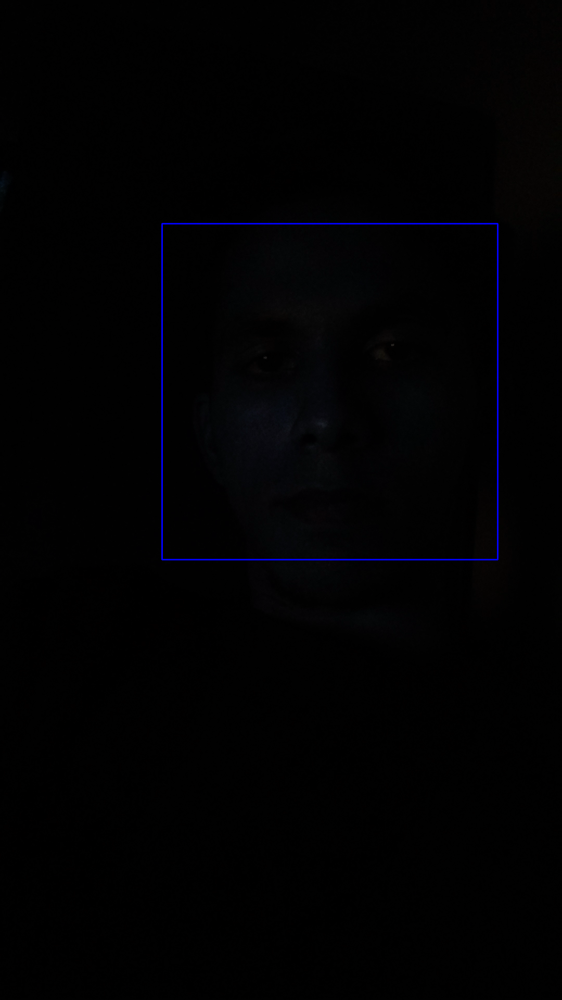

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: /content/face/histogram_equalization/detect.jpg is a low contrast image


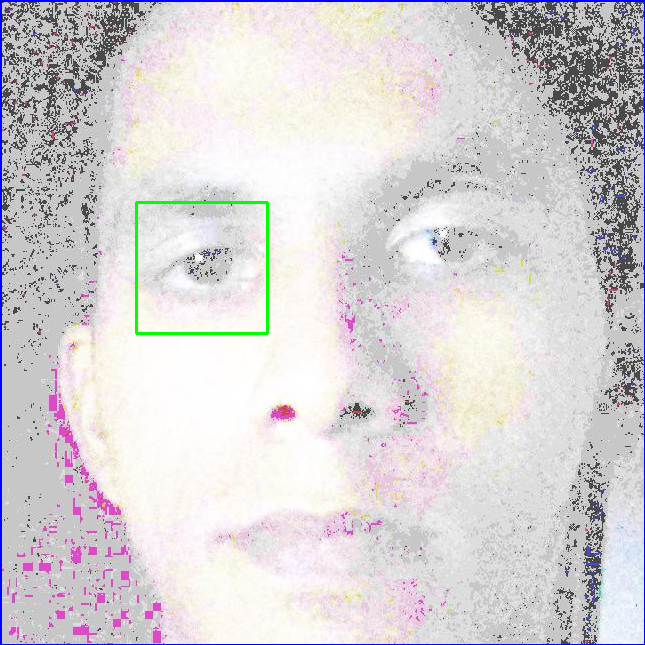

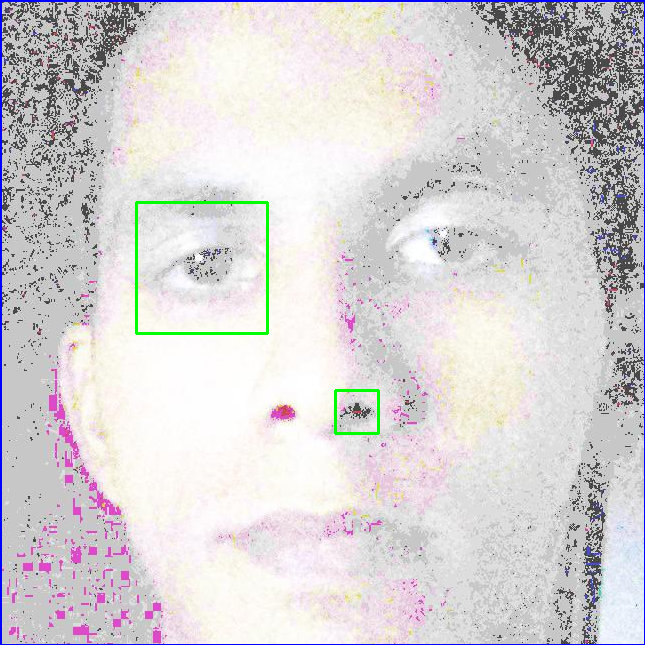

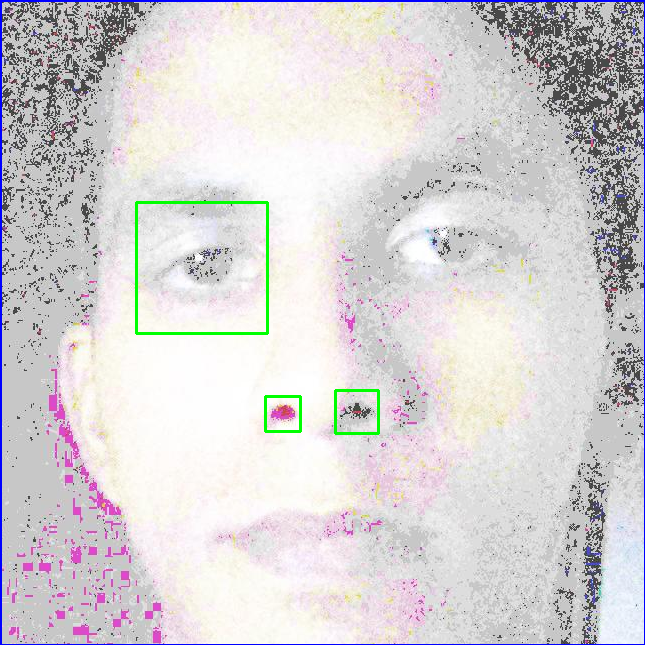

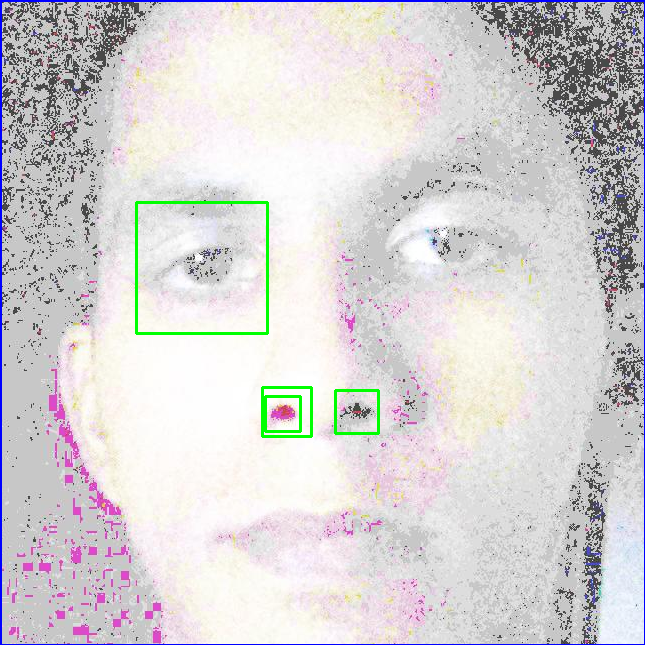

In [122]:
img = cv2.imread('/content/face/histogram_equalization/histogram_equalized.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray,1.1, 5)
for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    cv2.rectangle(img_p,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]

    cv2.imwrite('/content/face/histogram_equalization/crop.jpg', roi_color)
    
    #cv2.imwrite('gyt.jpg',roi_color)
    #eyes = eye_cascade.detectMultiScale(roi_gray)
    cv2_imshow(img_p)
    io.imsave('/content/face/histogram_equalization/detect.jpg',img_p)
    
    #Eye detection
    #for (ex,ey,ew,eh) in eyes:
    #    cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
    #    cv2_imshow(roi_color)
    
    cv2.waitKey(0)
    cv2.destroyAllWindows()

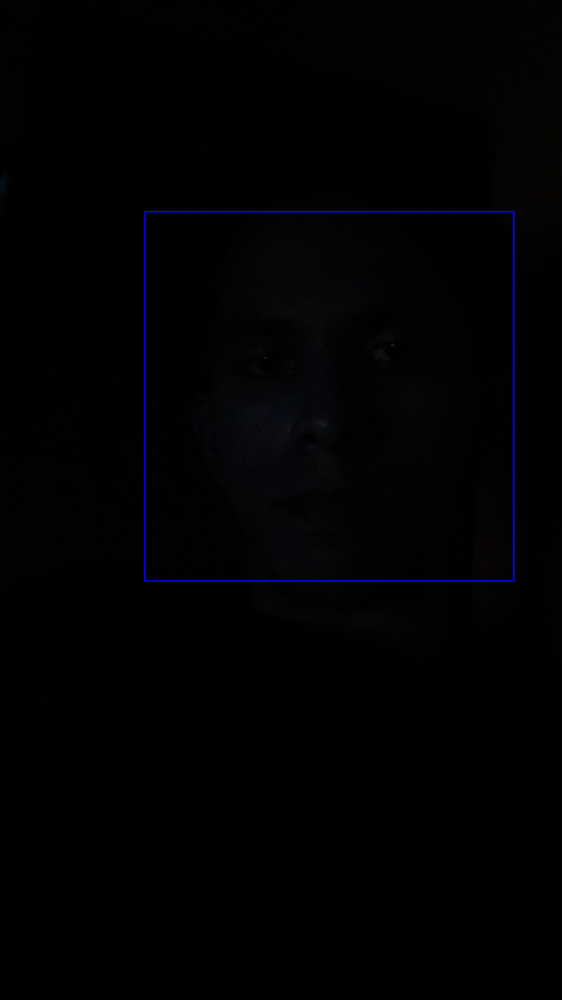

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: /content/face/adaptive_equalization/detect.jpg is a low contrast image


In [125]:
img = cv2.imread('/content/face/adaptive_equalization/adaptive_equalized.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray,1.1, 5)
for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    cv2.rectangle(img_q,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]

    cv2.imwrite('/content/face/adaptive_equalization/crop.jpg', roi_color)
    
    #cv2.imwrite('gyt.jpg',roi_color)
    #eyes = eye_cascade.detectMultiScale(roi_gray)
    cv2_imshow(img_q)
    io.imsave('/content/face/adaptive_equalization/detect.jpg',img_q)
        # for (ex,ey,ew,eh) in eyes:
        #cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
        #cv2.imshow('img',roi_color)
    cv2.waitKey(0)
    cv2.destroyAllWindows()